# MACHINE LEARNING

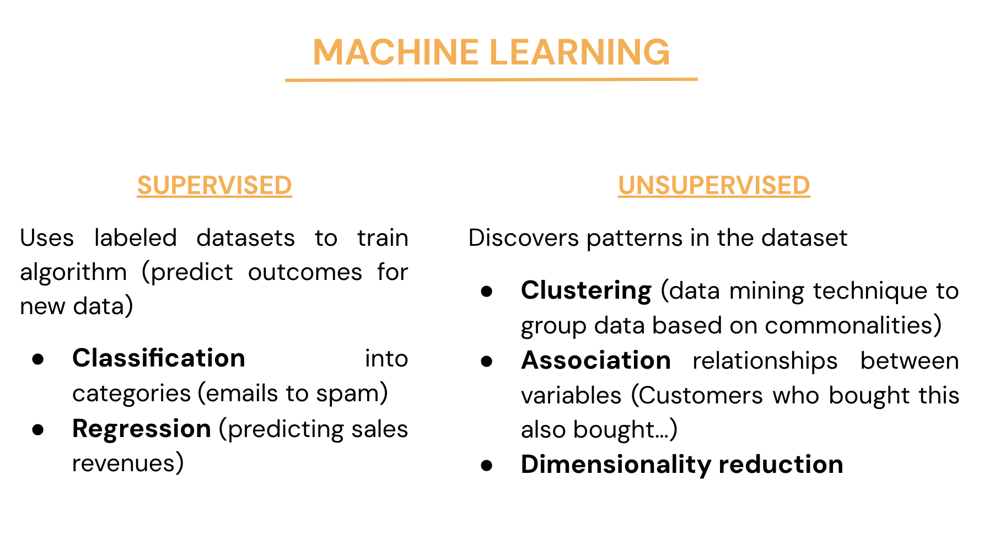

## Case exercise
- You are a winemaker who wants to predict revenue for next year by determining which wines are of higher quality
- You have a dataset of chemical composition of ~4000 wine samples
- We will look at the dataset and utilize unsupervised and supervised machine learning to gain insights into it and predict quality of wine based on the chemical readings

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff

from summarytools import dfSummary
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

pd.set_option('display.max_columns', None)

In [2]:
#Loading the data - pandas library
data_white_wine=pd.read_csv('winequality-white.csv',sep=';')
data_white_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


What does the data actually look like? Min, max, distribution... -> dfSummary

In [3]:
dfSummary(data_white_wine)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,fixed acidity[float64],Mean (sd) : 6.9 (0.8)min < med < max:3.8 < 6.8 < 14.2IQR (CV) : 1.0 (8.1),68 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACd0lEQVR4nO3cO44aQRRG4VtmwA1Y1bSwISMlsOSAkEXMYr0EBwROSNgBGeIhEBiGVzsiNDb9GPpvny+/qIIDUqnEdXEcG1B0H559AOBfvDz7APc45+pmVks4fozjeJ/lefA8hQ3VOVdvt9uv3vsoyfxms1k5574TazkUNlQzq3nvo+FwuA/D8PDI4Hq9DkajUbRYLGpmRqglUORQzcwsDMNDp9P5lWC0nvlh8DRcpiCBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGh8H/uS+pyuVTNzDvnkn4EewEKpJSh7na76ul0+tbr9SqVSuWhv1rfsBegWEoZ6vF4fAmCoDEYDA7dbnf16Dx7AYqnlKHeNJvNpDsBzNgLUChcpiCBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCGBUCEh191Tzrm6mdUSjvvr9VrN8jzQlVuozrl6u91+9d5HSeZPp1NwuVy+Hg6HH2aWdNFZYin3q7JbNWN5/qLWvPfRcDjch2H48I7S6XQaTSaTxvl8ruRxuHvS7ldlt2r2cl87GYZhotWPq9XqaWsf0+xXZbdqPkq9HzWtFPtV2a2aMW79kECokECokECokECokMCtPwc8FmTvr6GmeAb9L59AeSzIx91Q0zyD3p5A5/P5zyQH2263gZnZbrcLZrNZ471m084vl8tPQRA0+v2+a7Vab4/M7vf7j+Px+MtisfjsnNs8MlsCb3Ec//GL/Rvx6uNJki78WwAAAABJRU5ErkJggg=="">",0(0.0%)
2,volatile acidity[float64],Mean (sd) : 0.3 (0.1)min < med < max:0.1 < 0.3 < 1.1IQR (CV) : 0.1 (2.8),125 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACfUlEQVR4nO3du47aUBRG4X3CJQYUG8QEOrcUkVJQ0uQN8rBpp0sBJQ1vQIOQEBfhwGDAqaYKyYANiX9nff3xuFgwOrLZxyVJYkDevfvXNwBco/zIizvnamZWzXCJQ5Iku3vdD3Q9LFTnXK3dbn/1fb+V9hqbzWbpnPtGrHjkN2rV9/3WYDDYBUGwv3Xxer32hsNha7FYVM2MUP9zD/3Xb2YWBMG+0+n8SLm8dtebgSw2U5BAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJDw8AEUWZxOp4qZ+c65NMuZW1UguQ01iqJKHMefwzAslUqlm0cCMbeqWHIb6uFwKHueV+/3+/tut7u8ZS1zq4ont6G+ajQaaWdXMbeqQNhMQQKhQgKhQgKhQgKhQgKhQgKhQgKhQgKhQgKhQgKhQgKhQgKhQgKhQsKbr/llOCHaP5/PlRTrgF/8MdQsJ0THceydTqdP+/3+u5mlPQsVMLO3v1FTnxA9nU5bk8mkfjweSxnuDzCzK9/wT3NC9HK55A173A2bKUggVEggVEggVEggVEjI/e/608o4DsiMkUC5UshQs44DMmMkUN4UMtQs44DMGAmUR4UM9VWGcUBmjATKFTZTkECokECokECokECokFDoXX8WnB+QL4R6QdYHBqvVauucezazNA8biPwCQr0gywOD2Wz2YTQafQnD8IlDMu7nqlDX67V364W3261nZhZFkTefz+t/c/29/nYacRyXPc+r93o912w2X25Zu9vt3o/H44+LxeLJObdJew+iXpIk+e0H+yf6mvKfJQhxowAAAABJRU5ErkJggg=="">",0(0.0%)
3,citric acid[float64],Mean (sd) : 0.3 (0.1)min < med < max:0.0 < 0.3 < 1.7IQR (CV) : 0.1 (2.8),87 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACaUlEQVR4nO3dsY7aQBRG4TthIQaiMcgJdLQUkVJQ8hD7sHmEFLQ0vAEdkkFGELwYcKp0SXZtQ/DPnq+f8UgcGVFwx+V5bkDdfbj3AYC3eLrl5s65tpm1KmxxzPP8cK3zQNfNQnXOtaMoevbe98vusd1uN86578SKW75RW977/nQ6PYRhmBZdnCRJMJvN+nEct8yMUN+5m371m5mFYZgOBoOfJZe3r3oYyOLHFCQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiTc/F+oVZzP56aZeedcmeUMr3ggtQ11v983syz7NhqNGo1Go/BcAIZXPJbahno8Hp+CIOhMJpN0OBxuiqxleMXjqW2ov3W73bIDLBhe8UD4MQUJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJhAoJrw7ydc61zaxVYm9/uVyaJdZdRcX5/2bcAVAr/wzVOdeOoujZe98vunGWZcH5fP6apukPMyszMbq0qvP/zbgDoG5ee6O2vPf96XR6CMOw0Ae+XC77i8WiczqdGhXOV0qV+f9m3AFQR2+a4R+GYeE5+pvN5u4z9CvM/zfjDoBaqf1lE/fCHVf1Qqh/wB1X9fOmUJMkCYpuvNvtAjOz/X4frFarzv9cX/XZ6/X6UxAEnfF47Hq93kuRtYfD4eN8Pv8Sx/Fn59y26LPfsZc8z//6UvgFLDrYjPychCIAAAAASUVORK5CYII="">",0(0.0%)
4,residual sugar[float64],Mean (sd) : 6.4 (5.1)min < med < max:0.6 < 5.2 < 65.8IQR (CV) : 8.2 (1.3),310 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAB7

### Let's create a categorical variable for quality

In [4]:
data_white_wine['quality'].value_counts()

quality
6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: count, dtype: int64

In [5]:
data_white_wine['quality_cat']='bad'
data_white_wine.loc[data_white_wine.quality==6,'quality_cat']='medium'
data_white_wine.loc[data_white_wine.quality>6,'quality_cat']='good'

In [6]:
data_white_wine['quality_cat'].value_counts()

quality_cat
medium    2198
bad       1640
good      1060
Name: count, dtype: int64

In [7]:
data_white_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_cat
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,medium
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,medium
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,medium
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium


### Creating a category for sugar content as well

In [8]:
data_white_wine['sugar_cat']='extra dry'

mask=data_white_wine['residual sugar'].between(5,10)
data_white_wine.loc[mask,'sugar_cat']='dry'

mask=data_white_wine['residual sugar'].between(10,15)
data_white_wine.loc[mask,'sugar_cat']='semi-sweet'

mask=data_white_wine['residual sugar']>15
data_white_wine.loc[mask,'sugar_cat']='sweet'

## Before we do ML... some visual insights into the dataset

### Correlation heatmap
(Only correlates numerical variables)

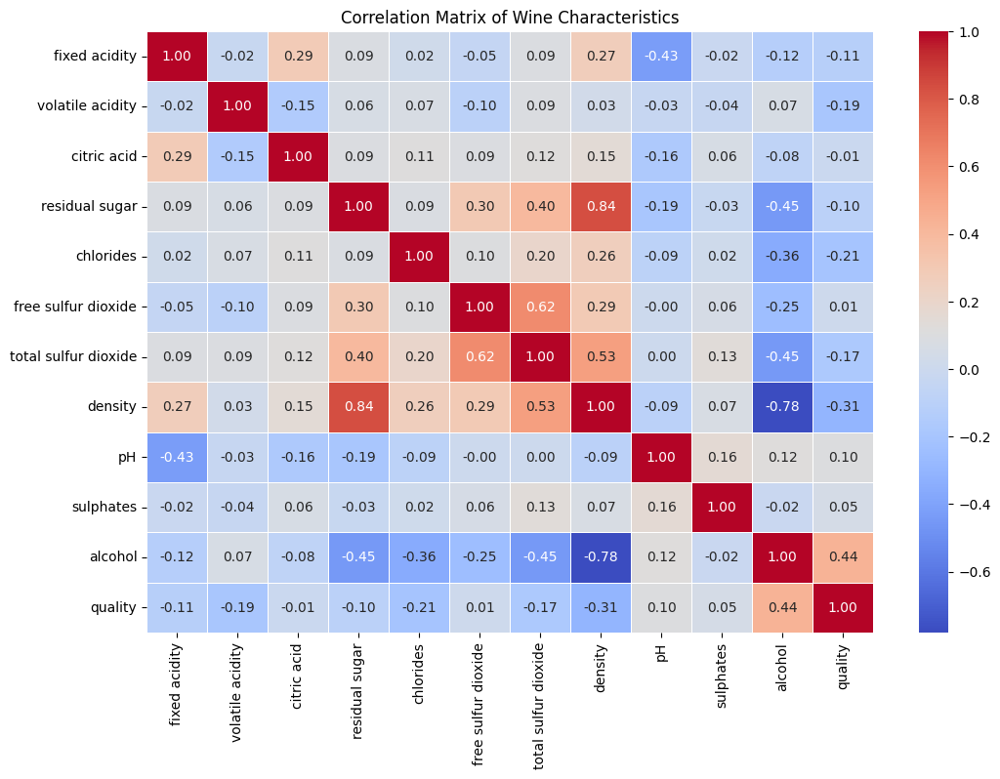

In [9]:
correlation_matrix = data_white_wine.corr(numeric_only=True)

## DON'T DELETE - plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Wine Characteristics')
plt.show()

### Let's look at some of these correlations on a scatter plot

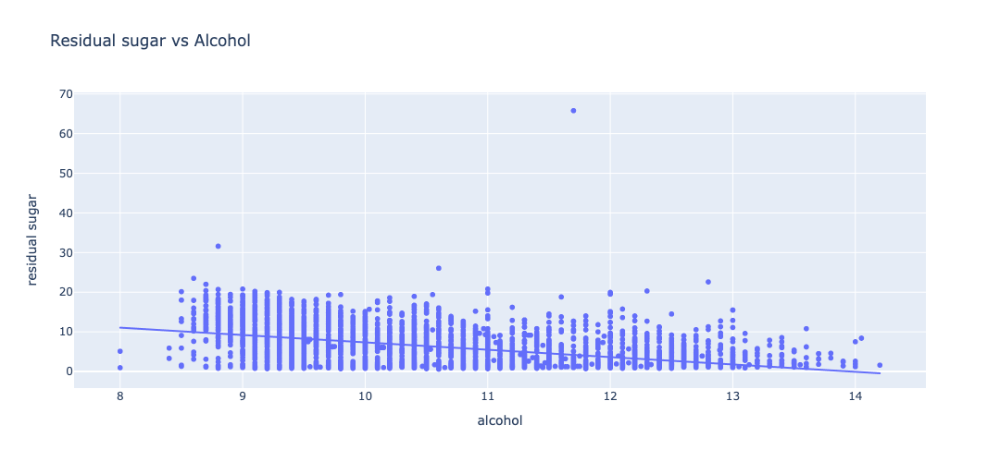

In [10]:
# Create a scatter plot of alcohol vs residual sugar with a trendline
fig = px.scatter(data_white_wine, x='alcohol', y='residual sugar', title='Residual sugar vs Alcohol', 
                 width=800, height=500, trendline="ols")

fig.show()

# Save as an HTML file and automatically open in your browser
fig.write_html('figure.html', auto_open=True)

In [11]:
data_white_wine.index.name = 'Sample'

# Reset the index to turn it into a regular column
data_white_wine.reset_index(inplace=True)

In [12]:
data_white_wine.quality_cat

0       medium
1       medium
2       medium
3       medium
4       medium
         ...  
4893    medium
4894       bad
4895    medium
4896      good
4897    medium
Name: quality_cat, Length: 4898, dtype: object

In [13]:
data_white_wine.head()

,Sample,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_cat,sugar_cat
0,0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,medium,sweet
1,1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,medium,extra dry
2,2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,medium,dry
3,3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium,dry
4,4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium,dry


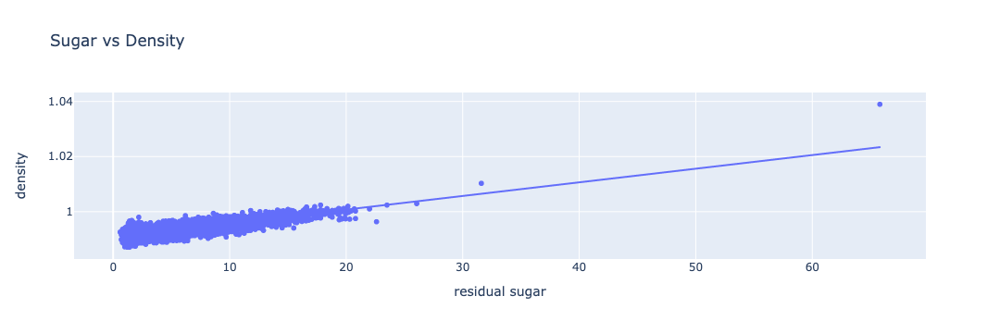

In [14]:
fig = px.scatter(data_white_wine, x='residual sugar', y='density', hover_name='Sample',
                 hover_data=['quality_cat'], title='Sugar vs Density', trendline="ols")

fig.show()

# Save as an HTML file and automatically open in your browser
#fig.write_html('figure.html', auto_open=True)

### Hexplot - a nice way of seeing correlation and distribution of data

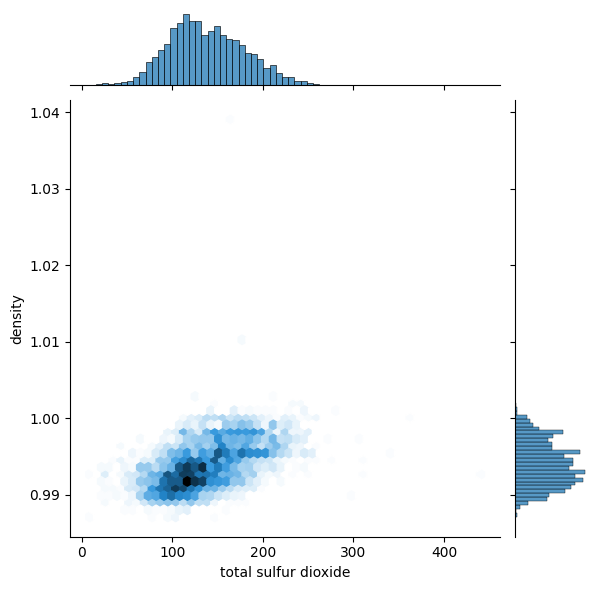

In [15]:
sns.jointplot(x='total sulfur dioxide', y='density', data=data_white_wine, kind='hex')

## Adding multiple dimensions to a 2D representation of data - bubble plot

We will plot:
- X axis
- Y axis

And some additional dimensions:
- size of data points (bubbles)
- colour of data points (bubbles)

#### You can gain a lot of insight in your dataset with these fundamental plotting functions without any AI/ML!

Useful tips for a good bubble chart:
- Normalize or not normalize? - parameter log_x = True or false
- Limiting the size of the bubbles - size_max

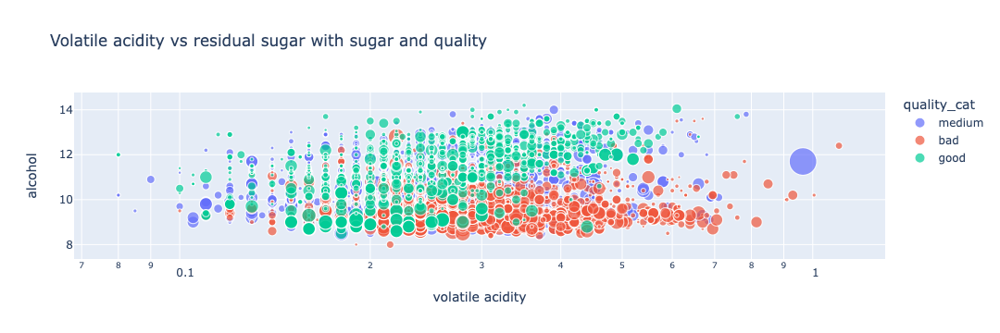

In [16]:
fig = px.scatter(data_white_wine, x='volatile acidity', y='alcohol', color='quality_cat',
                 size='residual sugar', title='Volatile acidity vs residual sugar with sugar and quality',
                 log_x=True, size_max=30)
fig.show()
#fig.write_html('figure.html', auto_open=True)

## We can see some clusters... but to cluster data effectively we need

## Unsupervised Machine Learning - Clustering

## <font color = 'blue'>  K-means clustering </font>

### K-means algorhitm
- Non-parametric “lazy” algorithm
- Uses proximity to classify / predict grouping of a data point
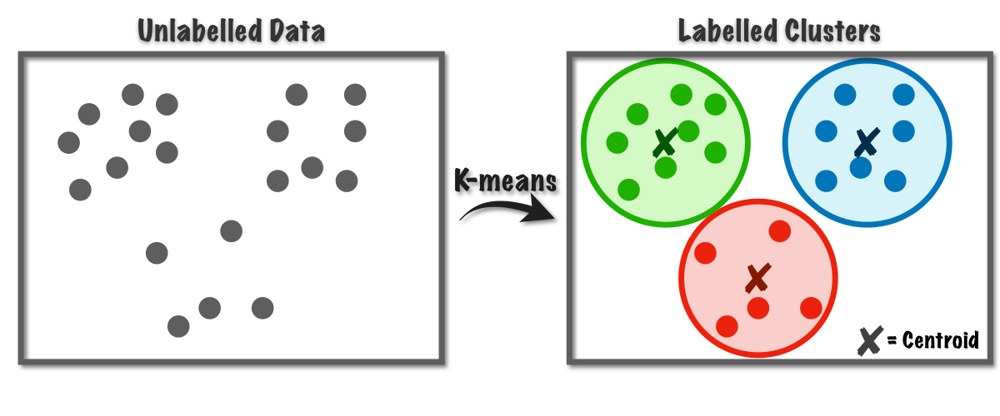

#### What is the k?
- The k value determines the number of neighbors considered for classification
- Lower k value = low bias and high variance
- Higher k value = high bias and low variance

#### Choosing the ideal k
- Balance between overfitting and underfitting
- Data with outliers or noise generally performs better with higher k
- k should be an odd number (to avoid ties)
- Cross-validation can be used to select the optimal k value for the dataset (more on that later)

#### Versatility
- both classification and prediction


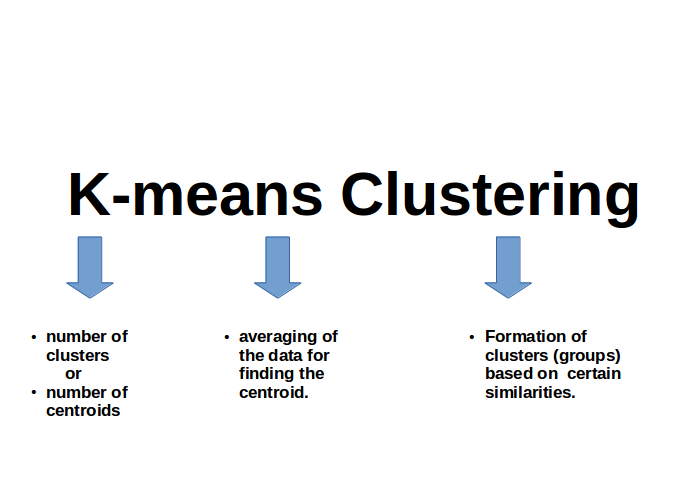

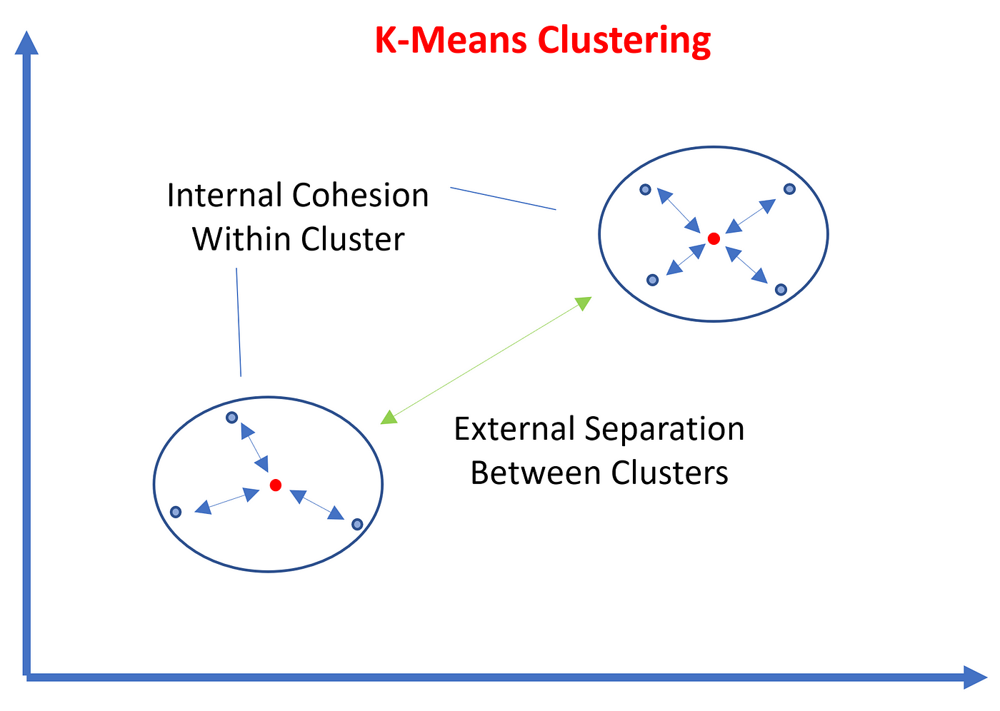

##  <font color = 'blue'> K-means clustering - basics </font>

### Importing libraries

## Choosing the ideal k - Elbow method

- Decision on optimal number of clusters
- Plotting within-cluster sum of squares (WCSS) against number of clusters
- WCSS = measure of how well the data points in clusters are clustered together (lower is better)
- Increase in cluster size means a decrease in WCSS. WCSS will level off after a certain point - **this point is called an elbow**
- Elbow is the point when adding more clusters doesn't improve clustering performance

## Inertia = unexplained variance within clusters

## Choosing the ideal k - actual metrics
### Calinski-Harabasz Score:
- **What it measures**: How well the clusters are separated and how dense they are.
- **Higher score means**: Better clustering because clusters are distinct and tightly packed.
- **Simple analogy**: If each cluster is a party, a high score means each party is lively (dense) and far enough from other parties (well-separated).

### Silhouette Score:
- **What it measures**: How close each point in one cluster is to points in the neighboring clusters.
- **Range**: Between -1 and 1.
- **Higher score means**: Better clustering because points are closer to their own cluster and farther from others.
- **Simple analogy**: If each cluster is a table at lunch, a high score means everyone sits closer to friends at their table and far from other tables.

We'll now look at that goes in the k-means algorhitm and how to calculate the ideal number of clusters

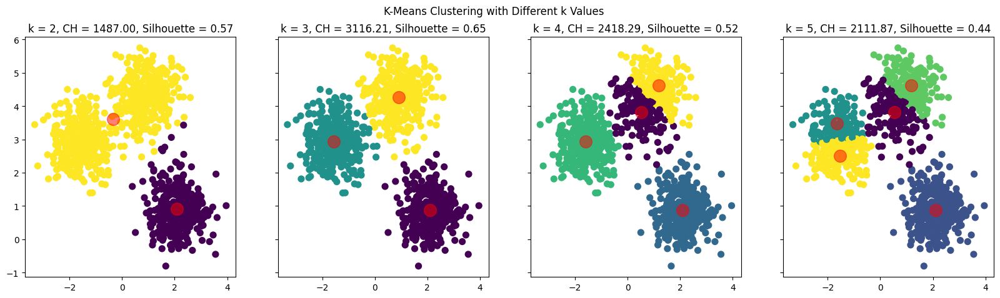

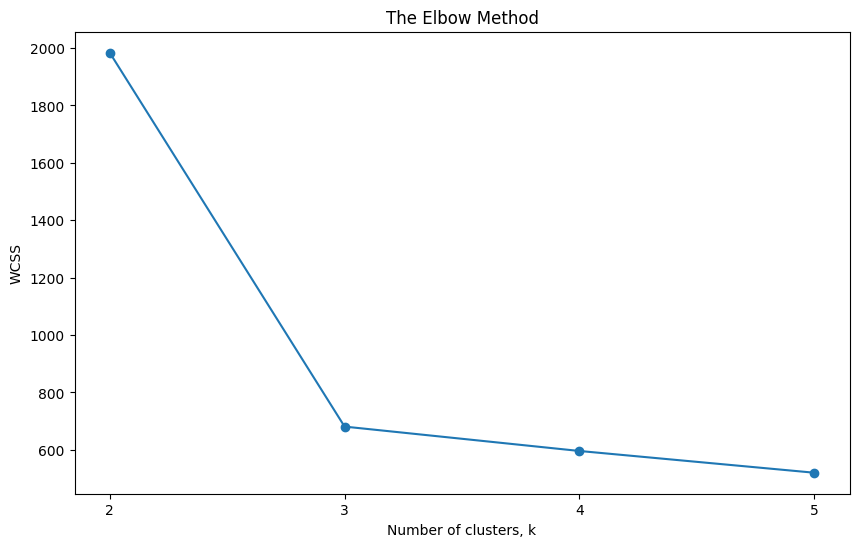

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Step 1: Generate 1000 points in 2D distributed in 3 clusters
X, _ = make_blobs(n_samples=1000, centers=3, cluster_std=0.60, random_state=0)

# Prepare the figure to plot different k-means results
fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharey=True)
fig.suptitle('K-Means Clustering with Different k Values')

k_values = [2, 3, 4, 5]
wcss = []
calinski_harabasz_scores = []
silhouette_scores = []

for i, k in enumerate(k_values):
    # Step 2: Apply K-Means clustering
    kmeans = KMeans(n_clusters=k, n_init = 10, random_state=0).fit(X)
    labels = kmeans.labels_
    
    # Calculate WCSS (within-cluster sum of squares)
    wcss.append(kmeans.inertia_)
    
    # Calculate Calinski-Harabasz score
    ch_score = calinski_harabasz_score(X, labels)
    calinski_harabasz_scores.append(ch_score)
    
    # Calculate Silhouette score
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)
    
    # Step 3: Plot the visualizations for each k
    axs[i].scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis')
    centers = kmeans.cluster_centers_
    axs[i].scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)
    axs[i].set_title(f'k = {k}, CH = {ch_score:.2f}, Silhouette = {silhouette_avg:.2f}')

plt.show()

# Step 4: Plot the elbow plot
plt.figure(figsize=(10, 6))
plt.plot(k_values, wcss, '-o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters, k')
plt.ylabel('WCSS')
plt.xticks(k_values)
plt.show()


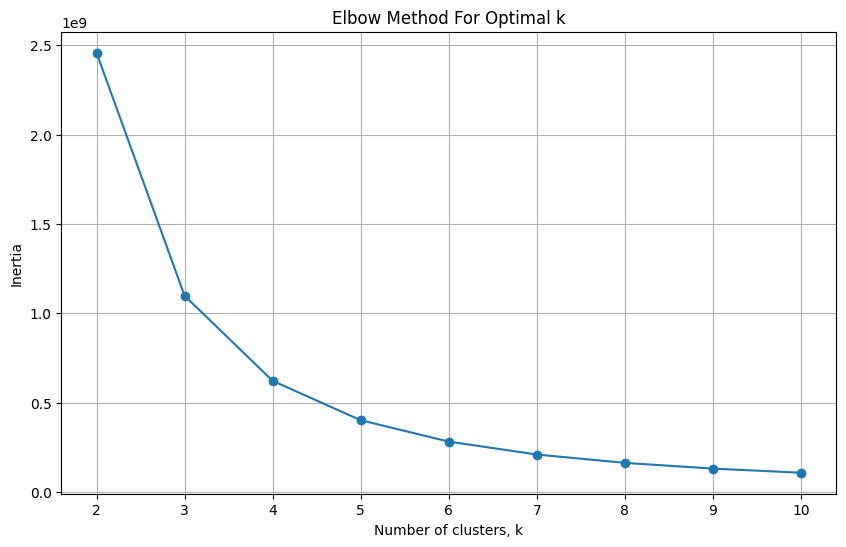

    k  Calinski-Harabasz Score  Silhouette Score
0   2             14628.095178          0.624298
1   3             19398.264330          0.585152
2   4             24073.006365          0.563812
3   5             28618.269335          0.549364
4   6             33017.250330          0.538192
5   7             37257.938923          0.528554
6   8             41275.661894          0.520394
7   9             45090.872726          0.512612
8  10             48729.663069          0.505266


In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score

def find_optimal_k_and_plot_elbow(data, k_range):
    scores = []
    inertias = []
    
    for k in k_range:
        # WE WILL WRITE THE K-MEANS ALGORITHM HERE
        model = KMeans(n_clusters=k, n_init=10, random_state=42)
        labels = model.fit_predict(data)
        
        # Record the inertia
        inertias.append(model.inertia_)
        
        # END OF K-MEANS ALG
        
        # Calculate the CH score
        ch_score = calinski_harabasz_score(data, labels)
        
        # Calculate the silhouette score
        if k > 1:  # silhouette score is only defined if number of labels is >1 and <n_samples
            silhouette_avg = silhouette_score(data, labels)
        else:
            silhouette_avg = float('nan')  # Not defined for k=1
        
        scores.append((k, ch_score, silhouette_avg))
    
    # Create a DataFrame to display the scores in a table
    score_df = pd.DataFrame(scores, columns=['k', 'Calinski-Harabasz Score', 'Silhouette Score'])
    
    # Plotting the Elbow Method Graph
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, inertias, '-o')
    plt.title('Elbow Method For Optimal k')
    plt.xlabel('Number of clusters, k')
    plt.ylabel('Inertia')
    plt.xticks(k_range)
    plt.grid(True)
    plt.show()
    
    return score_df

# Example usage
data = data_white_wine.drop(columns = ['quality', 'quality_cat', 'sugar_cat'])
k_range = range(2, 11)
scores_table = find_optimal_k_and_plot_elbow(data, k_range)
print(scores_table)


### Knowing the ideal k, let's apply the k-means algorhitm to the dataframe

In [19]:
k_means = KMeans(n_init = 10, n_clusters=5)
#Run the clustering algorithm
model = k_means.fit(data_white_wine.drop(columns = ['quality', 'quality_cat', 'sugar_cat']))
model
#Generate cluster predictions and store in y_hat
y_hat = k_means.predict(data_white_wine.drop(columns = ['quality', 'quality_cat', 'sugar_cat']))

In [20]:
y_hat

array([4, 4, 4, ..., 3, 3, 3], dtype=int32)

In [21]:
data_white_wine['cluster'] = y_hat.tolist()
data_white_wine.head()

,Sample,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_cat,sugar_cat,cluster
0,0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,medium,sweet,4
1,1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,medium,extra dry,4
2,2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,medium,dry,4
3,3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium,dry,4
4,4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium,dry,4


In [22]:
data_white_wine.cluster.value_counts()

cluster
2    983
0    982
1    979
3    979
4    975
Name: count, dtype: int64

## We can't visualise all of the variables at the same time
### every wine = separate dimension

# Dimensionality reduction - unsupervised ML

### Background
- High-dimensional data versus 2D / 3D space
- Challenges of working with high-dimensional data:
    - Curse of dimensionality: The number of possible combinations of features increases exponentially as the number of features increases. This can make it difficult to find patterns in the data, and it can also make it difficult to train machine learning models on the data.
    - **Sparsity:** High dimensional datasets are often sparse, which means that many of the features are zero.
    - Computational complexity: Analyzing high dimensional datasets can be computationally expensive. This is why we're looking to find the most effective algorhitm for every case.

# t-SNE - non-linear dimensionality reduction

- t-Distributed Stochastic Neighbor Embedding
- captures non-linear relationships
- preferred for visualizing complex, nonlinear patterns and **clusters** in the data
- algorithm uses probability distributions to model the relationships between data points in both the high-dimensional and low-dimensional spaces
- can be computationally intensive ane may require parameter tuning for optimal results

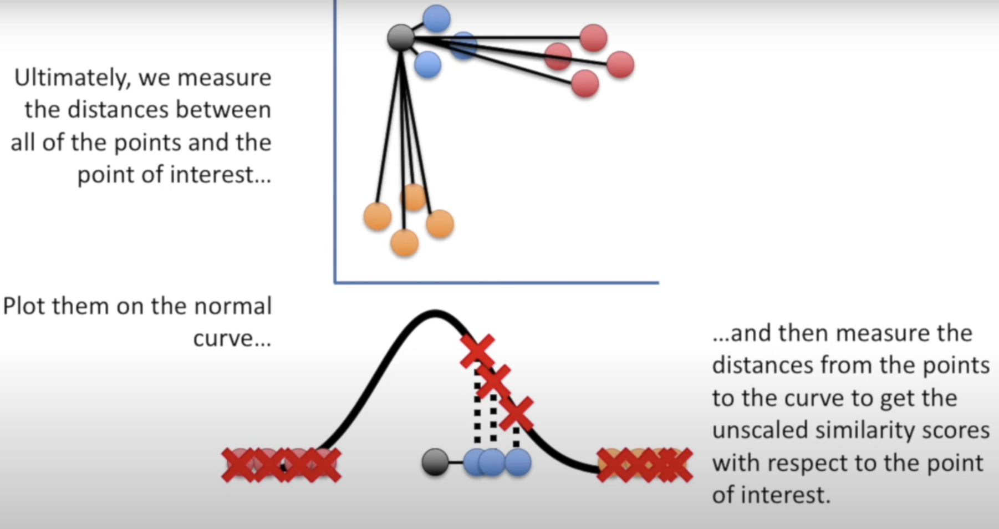

Drop columns

In [23]:
data = data_white_wine.drop(columns=['quality_cat', 'sugar_cat', 'quality', 'cluster'])

## Scaling the data - StandardScaler

- **Why Use a Scaler**:
  - Enhances model performance by treating all features equally.
  - Helps algorithms converge faster.
  - Necessary for models sensitive to feature scale, like SVMs and k-NN.
- **Initialize Scaler**: Creates a `StandardScaler` instance to standardize data.
- **Fit and Transform**: Applies the scaler to `data` to standardize features by removing the mean and scaling to unit variance.

In [24]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

scaled_df = pd.DataFrame(scaled_data, columns=data.columns)

## Performing tSNE
- **`n_components=2`**: Specifies the target dimensionality for visualization, allowing the data to be plotted on a 2D graph, ideal for visual interpretation.

- **`random_state=42`**: Sets a fixed seed for the algorithm's random number generator, guaranteeing that the t-SNE output is reproducible for consistent analysis.

- **`init='pca'`**: Uses the first two principal components from PCA as the starting point, which can lead to quicker convergence and may improve visualization by initially positioning similar points closer together.

- **`perplexity=50`**: A key parameter that helps balance attention between local and global data structures. A higher perplexity means the algorithm considers more neighbors for each point, potentially capturing more of the global data structure. The right perplexity value can depend on the dataset and requires some experimentation.

In [25]:
data_white_wine

,Sample,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_cat,sugar_cat,cluster
0,0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,medium,sweet,4
1,1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,medium,extra dry,4
2,2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,medium,dry,4
3,3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,medium,dry,4
4,4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,medium,dry,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,medium,extra dry,3
4894,4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,bad,dry,3
4895,4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,medium,extra dry,3
4896,4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,good,extra dry,3


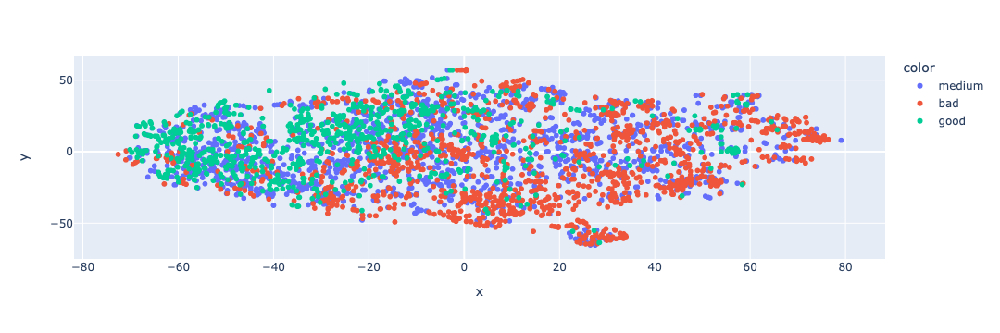

In [26]:
# Initialize t-SNE
tsne = TSNE(n_components=2, random_state=42, init = 'pca', perplexity = 50)

# Apply t-SNE to the data
X_tsne = tsne.fit_transform(scaled_df)
fig = px.scatter(x = X_tsne[:, 0], y = X_tsne[:, 1],color=data_white_wine.quality_cat)
fig.show()

## Colouring by k-means cluster

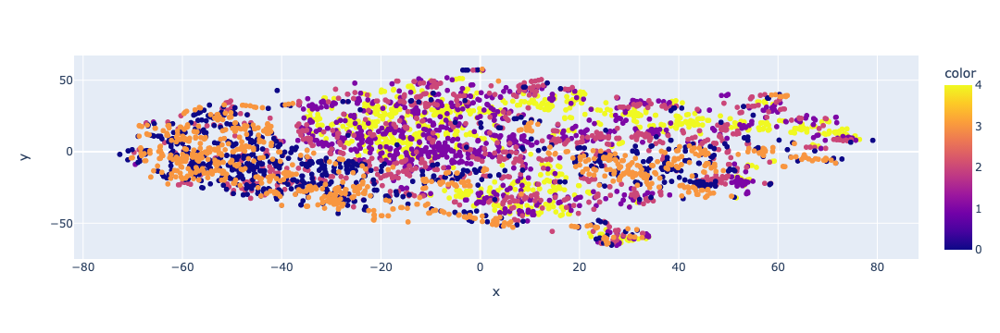

In [27]:
fig = px.scatter(x = X_tsne[:, 0], y = X_tsne[:, 1],color=data_white_wine.cluster)
fig.show()

## tSNE can be 3-dimensional

In [28]:
tsne = TSNE(n_components=3, random_state=42, init='pca', perplexity=50)

# Apply t-SNE to the data
X_tsne = tsne.fit_transform(scaled_df)

# Plot in 3D
fig = px.scatter_3d(
    x=X_tsne[:, 0], 
    y=X_tsne[:, 1], 
    z=X_tsne[:, 2],
    color=data_white_wine['quality_cat'])

fig.show()


In [29]:
# Plot in 3D
fig = px.scatter_3d(
    x=X_tsne[:, 0], 
    y=X_tsne[:, 1], 
    z=X_tsne[:, 2],
    color=data_white_wine['cluster'])

fig.show()

# Supervised learning - classification

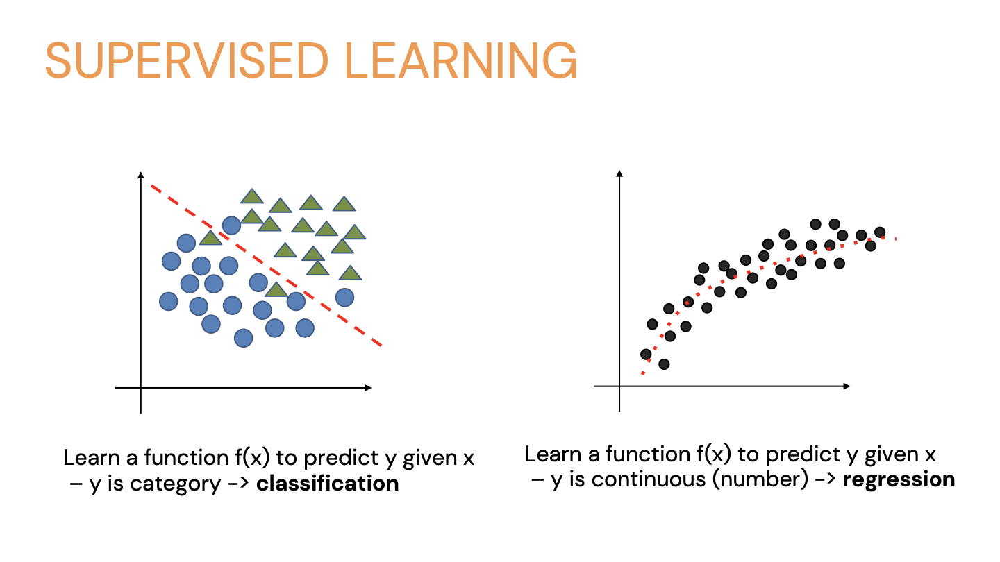

# Random forest

- Random Forest is an ensemble machine learning method.
    - **Ensemble Learning** combines the predictions from multiple machine learning algorithms to make more accurate predictions than any individual model.
- **Based on Decision Trees** - multiple decision trees to make predictions.
- **Randomness**: Adds randomness (selection of data points and features) to the model building to ensure diverse trees.
- **Decision:** For classification, it uses the majority vote. For regression, it averages the predictions.
- More resistant to overfitting than a single decision tree due to averaging.
- Effective for both classification and regression tasks.
- **Feature Importance**: Can assess the importance of different features for prediction.

Classifying as either A, B, C, or D
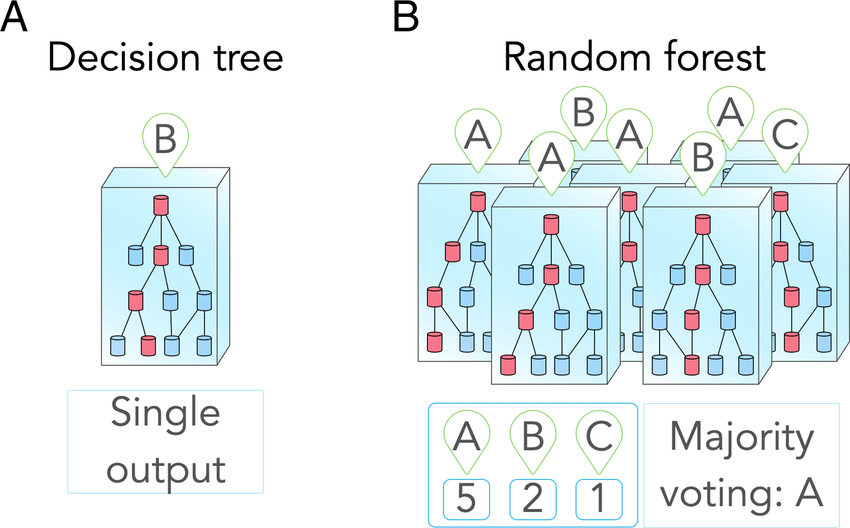

In [30]:
data_white_wine = pd.read_csv('winequality-white.csv', sep=';')

In [31]:
data_white_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


Making a new, binary quality_cat

In [32]:
data_white_wine['quality_cat']=0
data_white_wine.loc[data_white_wine.quality>=6,'quality_cat']=1

## Train/test split

- Dividing the dataset into two parts: one for training the model and the other for testing its performance.
- **Training Set**: Used to train the machine learning model. Typically, constitutes a larger portion of the data (e.g., 70-80%).
- **Testing Set**: Used to evaluate the model's performance on unseen data. This helps in assessing the model's generalization capability.
- Data is usually **split randomly** to ensure that the training and testing datasets are representative of the overall data distribution.
- **Stratification** during splitting to maintain the proportion of categorical variables between the train and test sets.
- **Cross-Validation**: An alternative or complementary approach where the dataset is divided into multiple smaller train-test splits to validate the model's performance more robustly.
- The test set can provide feedback on how adjustments to the model's parameters affect performance on unseen data.

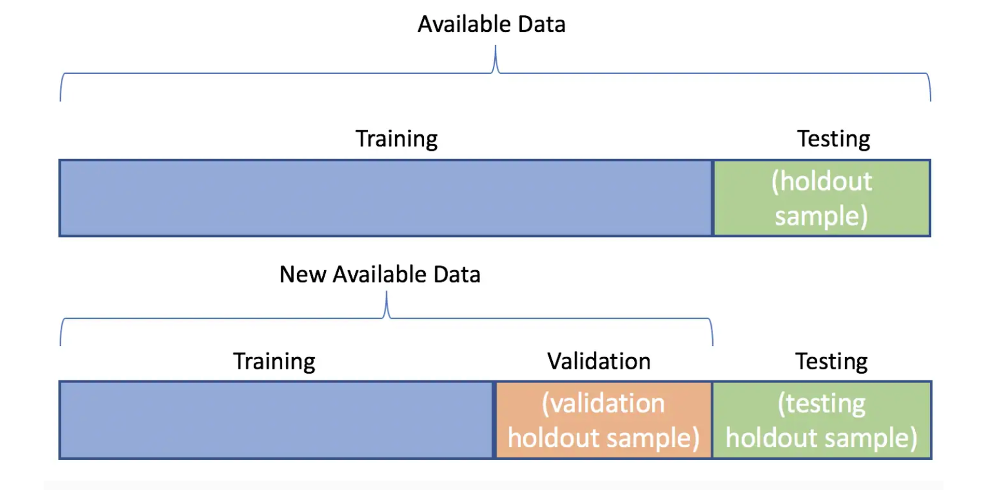

**To write the code, we need:**
- **Inputs**: 
  - `X`: The features or independent variables of the dataset.
  - `y`: The target or dependent variable of the dataset.

- **Parameters**: 
  - `test_size = 0.20`: Specifies that 20% of the data should be reserved for the test set.
  - `random_state=0`: A seed value for the random number generator. This ensures that the split is reproducible; the same random split will occur every time the code is run.

- **Outputs**: 
  - `X_train`: The portion of the features reserved for training the model.
  - `X_test`: The portion of the features reserved for testing the model's performance.
  - `y_train`: The portion of the target variable corresponding to `X_train`, used in training.
  - `y_test`: The portion of the target variable corresponding to `X_test`, used for evaluating the model's performance.
  
  

In [33]:
from sklearn.model_selection import train_test_split

In [34]:
X = data_white_wine.drop(columns = ['quality', 'quality_cat'])

In [35]:
y = data_white_wine['quality_cat']

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20,random_state=0)

In [37]:
from sklearn.ensemble import RandomForestClassifier

### Creating the classifier
We need to first initialize a RandomForestClassifier

**Parameters**:
  - `n_estimators=200`: Number of individual decision trees to make predictions.
  - `max_depth=15`: Limits the depth of each tree to 15 levels to prevent overly complex trees.
  - `criterion='entropy'`: Uses entropy to measure the quality of splits in the trees, a method for calculating information gain. Other option is Gini impurity. Entropy is more sensitive to changes in class distribution.
  - `class_weight='balanced'`: Adjusts weights inversely proportional to class frequencies, helping with imbalanced datasets.

**Training the Model**: `clf.fit(X_train, y_train)` trains the RandomForestClassifier with the training data (`X_train`) and the corresponding labels (`y_train`).

In [38]:
clf = RandomForestClassifier(n_estimators=200,max_depth=15,criterion='entropy',class_weight='balanced')
clf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, n_estimators=200)

### Random forest can assess importance of features, let's look at it

In [39]:
feature_importances = clf.feature_importances_

In [40]:
## DON'T DELETE - displaying feature importances as a dataframe
feature_importances_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

feature_importances_df

,Feature,Importance
10,alcohol,0.145846
7,density,0.113325
1,volatile acidity,0.109793
5,free sulfur dioxide,0.099185
6,total sulfur dioxide,0.082889
4,chlorides,0.082263
3,residual sugar,0.082212
2,citric acid,0.076988
8,pH,0.074673
9,sulphates,0.068675


In [41]:
import seaborn as sns

## Let's verify if this is true - making a simple correlation heatmap

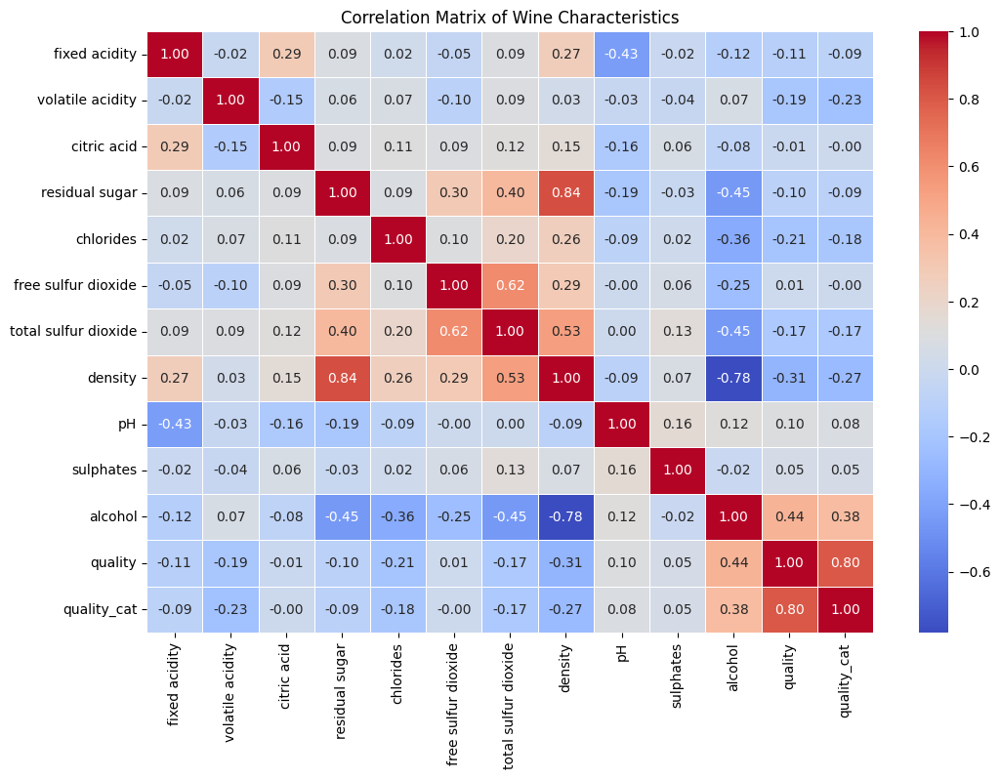

In [42]:
correlation_matrix = data_white_wine.corr(numeric_only=True)

## DON'T DELETE - plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Wine Characteristics')
plt.show()

### Using the classifier to make predictions
Making predictions on a set of test data **X_test** and storing them in a variable **pred_test**

In [43]:
pred_test=clf.predict(X_test)

## Predictive measures: Sensitivity, Specificity / Recall, Precision

- **Sensitivity (True Positive Rate)**:
  - Measures the proportion of actual positives correctly identified.
  - Formula: Sensitivity = TP / (TP + FN) where TP is true positives and FN is false negatives.

- **Specificity (True Negative Rate)**:
  - Measures the proportion of actual negatives correctly identified.
  - Formula: Specificity = TN / (TN + FP) where TN is true negatives and FP is false positives.

- **Precision (Positive Predictive Value)**:
  - Measures the proportion of positive identifications that were actually correct.
  - Formula: Precision = TP / (TP + FP) where TP is true positives and FP is false positives.

#### For binary classification problems, we can use a bit of math to simplify using means:
- **Sensitivity Calculation** (`pred_test[y_test==1].mean()`):
  - Selects predictions where the true label is positive (`y_test==1`).
  - Calculates the mean of these predictions.
  - The result represents the proportion of true positives correctly identified, i.e., sensitivity.

- **Specificity Calculation** (`1-pred_test[y_test==0].mean()`):
  - Selects predictions where the true label is negative (`y_test==0`).
  - Calculates the mean of these predictions, representing the proportion of false positives.
  - Subtracts this value from 1 to get the proportion of true negatives correctly identified, i.e., specificity.

- **Precision Calculation** (`y_test[pred_test==1].mean()`):
  - Selects true labels where the prediction is positive (`pred_test==1`).
  - Calculates the mean of these true labels.
  - The result represents the proportion of positive predictions that are actually true, i.e., precision.

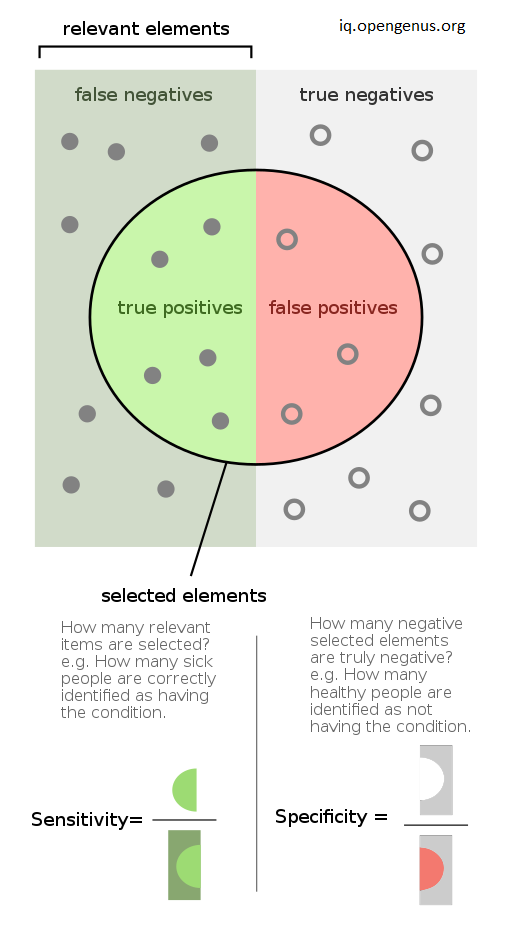

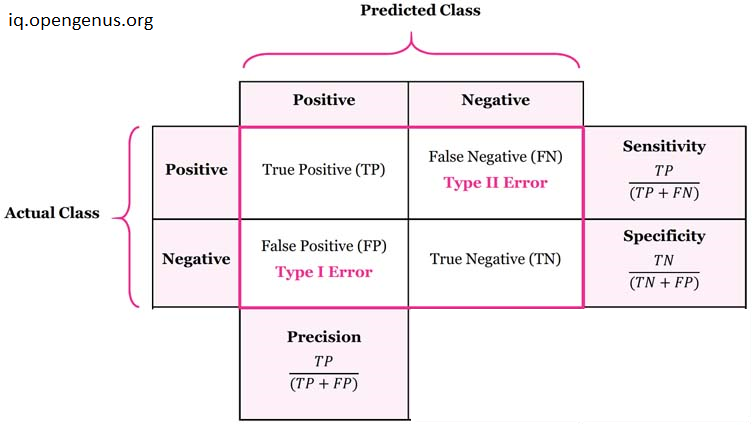

#### Sensitivity:

In [44]:
pred_test[y_test==1].mean()

0.9168

#### Specificity:

In [45]:
1-pred_test[y_test==0].mean()

0.6676056338028169

#### Precision:

In [46]:
y_test[pred_test==1].mean()

0.829232995658466

# Predicted probability
### The real output of model is continous number between 0 and 1!


#### Calculating and displaying predicted probabilities
- **`predict_proba` Method**: `clf.predict_proba(X_test)` produces a matrix with probabilities that each observation in `X_test` belongs to each class.
- **Selecting Positive Class Probabilities**: `[:,1]` selects the second column from this matrix, which contains probabilities of the positive class (usually class "1").

In [47]:
pred_probs=clf.predict_proba(X_test)[:,1]

In [48]:
pred_probs

array([0.35692652, 0.50981421, 0.80376211, 0.955     , 0.60782827,
       0.26560388, 0.94425605, 0.89051165, 0.70535451, 0.43146435,
       0.73703846, 0.98715231, 0.10935413, 0.43931632, 0.90338106,
       0.72316976, 0.74263137, 0.22260819, 0.98830632, 0.9481594 ,
       0.61959381, 0.97833994, 0.58233096, 0.62460656, 0.76103122,
       0.985     , 0.26648041, 0.13058368, 0.88112705, 0.78230502,
       0.11958018, 0.11457742, 0.86672249, 0.91960068, 0.20250297,
       0.90442452, 0.88458926, 0.99977828, 0.99410968, 0.8450817 ,
       0.37731445, 0.54276495, 0.36324757, 0.90506439, 0.17352877,
       0.78359589, 0.20526191, 0.98735179, 0.99830632, 0.72210872,
       0.99862463, 0.95155578, 0.325     , 0.89720758, 0.47304751,
       0.98212605, 0.31123845, 0.95940572, 0.17920033, 0.96872842,
       0.43472419, 0.4163736 , 0.85036637, 0.85471971, 0.77903172,
       0.73445896, 0.32176142, 0.23142441, 0.15928008, 0.11369712,
       0.89893871, 0.14081207, 0.13632756, 0.91124329, 0.83370

(array([ 31.,  89.,  61.,  59.,  61.,  75.,  79., 127., 151., 247.]),
 array([0.03383078, 0.1304477 , 0.22706462, 0.32368154, 0.42029847,
        0.51691539, 0.61353231, 0.71014923, 0.80676616, 0.90338308,
        1.        ]),
 <BarContainer object of 10 artists>)

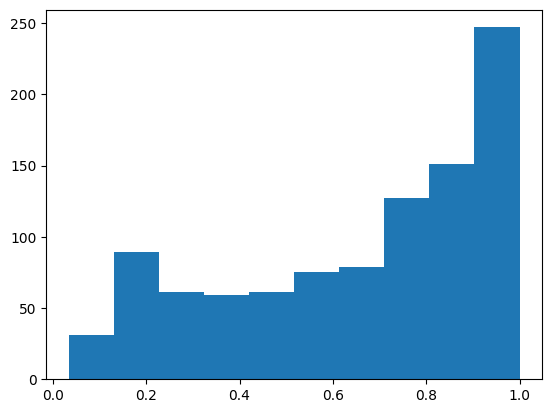

In [49]:
plt.hist(pred_probs)

Setting a threshold

In [50]:
pred_test_cutoff=pred_probs>0.8

New sensitivity, specificity, precision

In [51]:
print('Sensitivity: ',pred_test_cutoff[y_test==1].mean() )
print('Specificity: ',1-pred_test_cutoff[y_test==0].mean())
print('Precision: ',y_test[pred_test_cutoff==1].mean())

Sensitivity:  0.6208
Specificity:  0.9380281690140845
Precision:  0.9463414634146341


## ROC-AUC - the most important measure
  - ROC (Receiver Operating Characteristic) curve visualizes the performance of a binary classifier - plotting sensitivity (true positive rate) versus 1-specificity (false pocitive rate).
  - AUC (Area Under the ROC Curve) measures the entire two-dimensional area underneath the ROC curve.

- **Performance Indicator**:
  - AUC values range from 0 to 1.
  - A model with AUC of 1 is perfect, predicting all positives and negatives correctly.
  - A model with AUC of 0.5 has no discriminative ability, equivalent to random guessing.

- **Importance**:
  - **Threshold Independent**: Evaluates model performance across all classification thresholds, providing a comprehensive measure.
  - **Imbalance Handling**: Effective in assessing models on imbalanced datasets, where positive and negative classes are not equally represented.
  - **Comparison**: Allows comparison between models; a higher AUC indicates a better model.

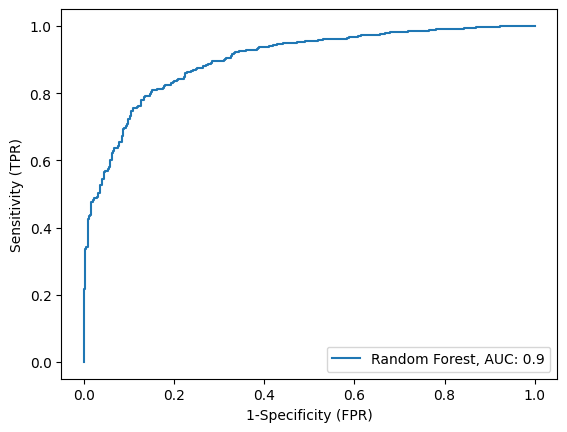

In [52]:
fpr, tpr, thresholds = roc_curve(y_test, pred_probs)
roc_auc = auc(fpr, tpr)

## Plotting the ROC-AUC
plt.plot(fpr,tpr,label='Random Forest, AUC: ' + str(round(roc_auc,3)))
plt.ylabel('Sensitivity (TPR)')
plt.xlabel('1-Specificity (FPR)')
plt.legend(loc='lower right')

Let's store the predicted values in the dataframe

In [53]:
data_white_wine['predicted'] = clf.predict_proba(X)[:,1]

In [54]:
data_white_wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_cat,predicted
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1,0.823434
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,1,0.787312
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1,0.780337
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1,0.884312
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1,0.884312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1,0.948159
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0,0.198031
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1,0.806112
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1,0.989843


### Plotting the distribution of the predicted values

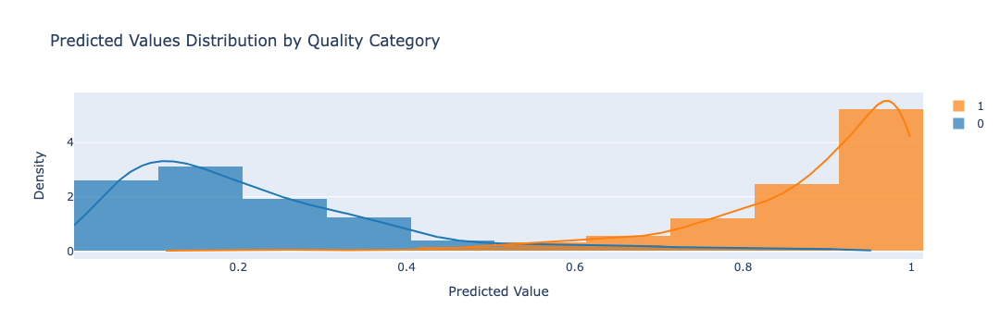

In [55]:
groups = data_white_wine.groupby('quality_cat')['predicted']
hist_data = [group for _, group in groups]
group_labels = [str(label) for label in groups.groups.keys()]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1, show_rug=False)

# Customize layout
fig.update_layout(title='Predicted Values Distribution by Quality Category',
                  xaxis_title='Predicted Value',
                  yaxis_title='Density')

fig.show()

#### Plotting Actual vs predicted

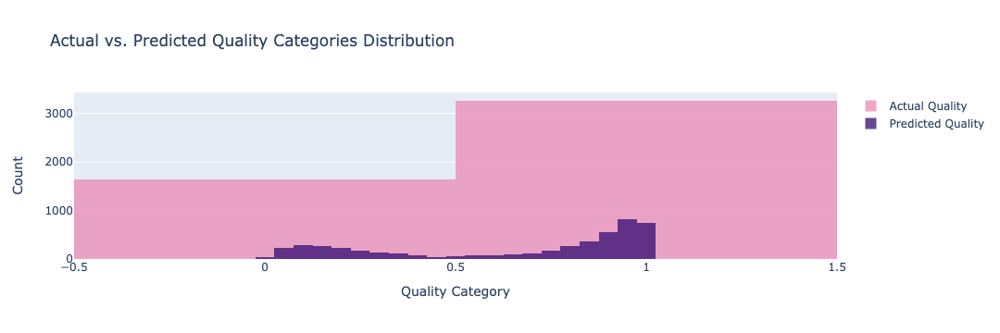

In [56]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Histogram(x=data_white_wine['quality_cat'], name='Actual Quality', marker_color='#EB89B5', opacity=0.75))
fig.add_trace(go.Histogram(x=data_white_wine['predicted'], name='Predicted Quality', marker_color='#330C73', opacity=0.75))


fig.update_layout(barmode='overlay')
fig.update_layout(title_text='Actual vs. Predicted Quality Categories Distribution', 
                  xaxis_title_text='Quality Category', 
                  yaxis_title_text='Count')

fig.show()


# THANK YOU FOR YOUR ATTENTION!